Fit Baker et al. data with linear & nonlinear models.

In [1]:
%matplotlib inline
from copy import deepcopy as copy
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy.linalg import hankel
from scipy import optimize, signal, stats
from sklearn.linear_model import LinearRegression
import sys

from disp import set_font_size

cc = np.concatenate

FPS = 8.5
DT = 1/FPS
NT = 300
T = DT*np.arange(NT) - 10

IT_STIM = (85, 170)
IDUR_STIM = IT_STIM[1] - IT_STIM[0]
DUR_STIM = DT*IDUR_STIM

T_COLS = [f'IT_{it}' for it in range(NT)]

IDUR_H = 85
H_T_COLS = [f'IT_H_S_{it}' for it in range(IDUR_H)] + [f'IT_H_P_{it}' for it in range(IDUR_H)]

LOAD_FILE = 'data/simple/baker.csv'

In [2]:
# load data
df = pd.read_csv(LOAD_FILE)
expt_ids = np.sort(np.unique(df['EXPT_ID']))

df

,EXPT_ID,STIM,LINE,FLY,ROI,ROI_USED,IT_0,IT_1,IT_2,IT_3,...,IT_290,IT_291,IT_292,IT_293,IT_294,IT_295,IT_296,IT_297,IT_298,IT_299
0,0,S,R70G01,0,somas,False,-0.286139,-0.251529,-0.214845,-0.085881,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0,P,R70G01,0,somas,False,-0.090690,-0.071585,0.027546,-0.089212,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1,S,R70G01,1,somas,False,-0.074163,-0.052967,-0.226459,-0.086673,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1,P,R70G01,1,somas,False,-0.094280,-0.175828,-0.132839,-0.155376,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2,S,R70G01,2,somas,False,-0.359071,-0.296972,-0.283760,-0.206650,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
443,221,P,vPN1_split,0,somas,False,0.308926,0.069519,-0.028961,-0.103122,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
444,222,S,vPN1_split,1,somas,False,0.268154,0.517779,0.526319,0.353496,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
445,222,P,vPN1_split,1,somas,False,0.563747,0.506288,0.271983,0.002747,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
446,223,S,vPN1_split,2,somas,False,0.023391,0.023677,0.009701,0.006185,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
# smln function
def smlt(h_s, h_p, t_0, inp):
    """Simulate response to sine or pulse inputs."""
    stim = np.zeros(NT)
    stim[(t_0 <= T) & (T < t_0 + DUR_STIM)] = 1

    if inp == 's':
        r = signal.fftconvolve(stim, h_s, mode='full')[:NT]*DT
    elif inp == 'p':
        r = signal.fftconvolve(stim, h_p, mode='full')[:NT]*DT
    
    return r


def make_dsn_mat(x, nbak):
    return hankel(cc([np.zeros(nbak-1), x]))[:len(x), :nbak]

Fit linear filters

In [4]:
# loop over expt_ids
cols_pred_lin = df.columns
data_pred_lin = []

cols_param_lin = ['EXPT_ID', 'LINE', 'FLY', 'ROI', 'ROI_USED', 'FIT_ERR', 'SUCCESS', 'IDUR_H'] + ['T_0', 'R_0'] + [f'IT_H_S_{it}' for it in range(IDUR_H)] + [f'IT_H_P_{it}' for it in range(IDUR_H)]
data_param_lin = []

for expt_id in expt_ids:
    sys.stdout.write('.')
    row_s = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'S')].iloc[0]
    row_p = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'P')].iloc[0]
    line = row_s['LINE']
    fly = row_s['FLY']
    roi = row_s['ROI']
    roi_used = row_s['ROI_USED']
    
    r_s = np.array(row_s[T_COLS]).astype(float)
    r_p = np.array(row_p[T_COLS]).astype(float)
    
    mvalid_s = ~np.isnan(r_s)
    mvalid_p = ~np.isnan(r_p)
    
    # fit model
    t_0s = -DT*np.arange(-2, 9)
    sq_err_best = np.inf
    for t_0 in t_0s:
        stim = np.zeros(NT)
        stim[(t_0 <= T) * (T < t_0 + DUR_STIM)] = 1
        
        # build stim design matrix
        stim_mat = make_dsn_mat(stim, IDUR_H)
        
        # get sine filter
        h_s = LinearRegression().fit(stim_mat[mvalid_s, :], r_s[mvalid_s]/DT).coef_[::-1]
        h_p = LinearRegression().fit(stim_mat[mvalid_p, :], r_p[mvalid_p]/DT).coef_[::-1]
        
        sq_err = .5*np.nanmean((r_s-smlt(h_s, h_p, t_0, 's'))**2) + .5*np.nanmean((r_p-smlt(h_s, h_p, t_0, 'p'))**2)
        if sq_err < sq_err_best:
            sq_err_best = sq_err
            t_0_best = t_0
            h_s_best = h_s
            h_p_best = h_p
        
    t_0 = t_0_best
    
    # unpack params
    r_0 = 0
    h_s = h_s_best.copy()
    h_p = h_p_best.copy()
    
    # make predictions
    stim = np.zeros(NT)
    stim[(t_0 <= T) & (T < t_0 + DUR_STIM)] = 1
    
    pred_s = smlt(h_s, h_p, t_0, 's') + r_0
    pred_p = smlt(h_s, h_p, t_0, 'p') + r_0
    
    # store predictions
    pred_dict_s = {'EXPT_ID': expt_id, 'STIM': 'S', 'LINE': line, 'FLY': fly, 'ROI': roi, 'ROI_USED': roi_used}
    pred_dict_p = {'EXPT_ID': expt_id, 'STIM': 'P', 'LINE': line, 'FLY': fly, 'ROI': roi, 'ROI_USED': roi_used}
    
    # add time cols
    for it, t_col in enumerate(T_COLS):
        pred_dict_s[t_col] = pred_s[it]
        pred_dict_p[t_col] = pred_p[it]
        
    data_pred_lin.extend([pred_dict_s, pred_dict_p])
    
    # store params
    param_dict = {'EXPT_ID': expt_id, 'LINE': line, 'FLY': fly, 'ROI': roi, 'ROI_USED': roi_used}
    param_dict['FIT_ERR'] = np.sqrt(np.nanmean((pred_s - r_s)**2 + (pred_p - r_p)**2))
    param_dict['SUCCESS'] = 1
    param_dict['IDUR_H'] = IDUR_H
    param_dict['T_0'] = t_0
    param_dict['R_0'] = r_0
    
    # add h_s & h_p cols
    for it in range(IDUR_H):
        param_dict[f'IT_H_S_{it}'] = h_s[it]
        param_dict[f'IT_H_P_{it}'] = h_p[it]
        
    data_param_lin.append(param_dict)

................................................................................................................................................................................................................................

In [5]:
df_param_lin = pd.DataFrame(columns=cols_param_lin, data=data_param_lin)
df_pred_lin = pd.DataFrame(columns=cols_pred_lin, data=data_pred_lin)

In [6]:
df_param_lin.to_csv('data/simple/baker_lin_fit_param.csv', index=False)
df_pred_lin.to_csv('data/simple/baker_lin_fit_pred.csv', index=False)

# Examine fits

In [7]:
df_param_lin = pd.read_csv('data/simple/baker_lin_fit_param.csv')
df_pred_lin = pd.read_csv('data/simple/baker_lin_fit_pred.csv')

In [8]:
df_param_lin

,EXPT_ID,LINE,FLY,ROI,ROI_USED,FIT_ERR,SUCCESS,IDUR_H,T_0,R_0,...,IT_H_P_75,IT_H_P_76,IT_H_P_77,IT_H_P_78,IT_H_P_79,IT_H_P_80,IT_H_P_81,IT_H_P_82,IT_H_P_83,IT_H_P_84
0,0,R70G01,0,somas,False,0.174497,1,85,0.235294,0,...,-0.154953,-0.073905,-0.007819,-0.506101,0.231079,0.131478,0.380165,1.043530,0.523804,-2.027452
1,1,R70G01,1,somas,False,0.173904,1,85,0.235294,0,...,-0.808924,0.464651,-0.320987,0.582338,0.282897,-0.153832,-0.394784,1.707338,-0.719647,-0.152941
2,2,R70G01,2,somas,False,0.170188,1,85,0.235294,0,...,-0.339182,0.267191,0.125736,-0.641290,0.483302,-0.417439,0.945032,1.250669,-0.291958,-0.910192
3,3,R70G01,3,somas,False,0.365310,1,85,0.235294,0,...,-1.042894,1.202923,-2.168054,0.977008,-0.909011,-1.937358,3.046854,-1.023927,0.129524,-1.712622
4,4,R70G01,4,somas,False,0.153828,1,85,0.235294,0,...,-0.511628,-0.399655,-0.150975,-0.333150,-0.033365,0.079399,0.435384,0.419418,0.733692,-2.437793
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
219,219,VT34811,0,somas,False,0.220064,1,85,-0.470588,0,...,-1.653836,2.237410,-0.589508,-0.483772,1.333863,2.307638,-1.417966,-0.412455,-1.430931,0.913422
220,220,VT34811,0,ascending projection,False,0.066786,1,85,-0.705882,0,...,-0.013608,0.071371,-0.077927,-0.024410,-0.102891,0.050893,0.021110,-0.073407,0.014354,0.555983
221,221,vPN1_split,0,somas,False,0.421309,1,85,-0.941176,0,...,-0.091841,2.063789,-1.226476,-0.652369,2.441115,0.451942,-0.476302,3.120248,-0.000051,-2.094935
222,222,vPN1_split,1,somas,False,0.923838,1,85,-0.705882,0,...,9.607118,3.330856,-7.545851,4.314196,4.479567,-5.405843,-4.439488,12.160638,-2.870428,-9.383391


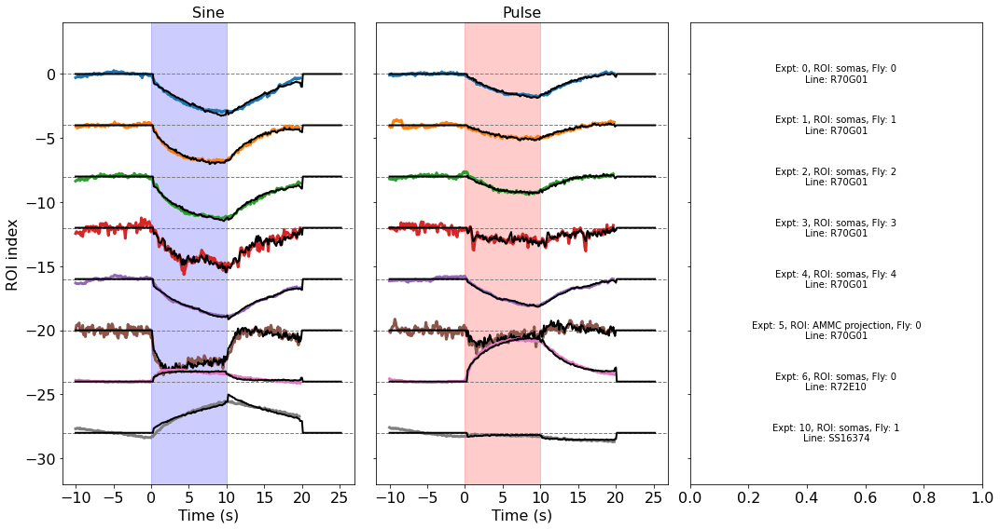

In [13]:
expt_ids_plot = [0, 1, 2, 3, 4, 5, 6, 10]
nroi_plot = len(expt_ids_plot)
t = np.arange(NT)*DT - 10

fig, axs = plt.subplots(1, 3, figsize=(15, nroi_plot), sharey=True,  tight_layout=True)
for cexpt, expt_id in enumerate(expt_ids_plot):
    # true response
    ## sine response
    row_s = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'S')].iloc[0]
    rsp_s = np.array(row_s).flatten()[6:]
    
    roi = row_s['ROI']
    fly = row_s['FLY']
    line = row_s['LINE']
    
    axs[0].axhline(-4*cexpt, lw=1, ls='--', c='gray')
    axs[0].plot(T, rsp_s - 4*cexpt, lw=3)
    
    ## pulse response
    row_p = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'P')].iloc[0]
    rsp_p = np.array(row_p).flatten()[6:]
    
    axs[1].axhline(-4*cexpt, lw=1, ls='--', c='gray')
    axs[1].plot(T, rsp_p - 4*cexpt, lw=3)
    
    axs[2].text(0.5, -4*cexpt, f'Expt: {expt_id}, ROI: {roi}, Fly: {fly}\nLine: {line}', ha='center', va='center')
    
    # prediction
    ## sine response
    row_s = df_pred_lin[(df_pred_lin['EXPT_ID'] == expt_id) & (df_pred_lin['STIM'] == 'S')].iloc[0]
    rsp_s = np.array(row_s).flatten()[6:]
    
    axs[0].plot(T, rsp_s - 4*cexpt, lw=2, c='k')
    
    ## pulse response
    row_p = df_pred_lin[(df_pred_lin['EXPT_ID'] == expt_id) & (df_pred_lin['STIM'] == 'P')].iloc[0]
    rsp_p = np.array(row_p).flatten()[6:]
    
    axs[1].plot(T, rsp_p - 4*cexpt, lw=2, c='k')
    
axs[0].set_ylabel('ROI index')

for ax, c, stim in zip(axs[:2], ['b', 'r'], ['Sine', 'Pulse']):
    ax.axvspan(T[IT_STIM[0]], T[IT_STIM[1]], color=c, alpha=.2)
    ax.set_title(stim)
    ax.set_ylim(-4*nroi_plot, 4)
    ax.set_xlabel('Time (s)')
    
set_font_size(axs, 16)

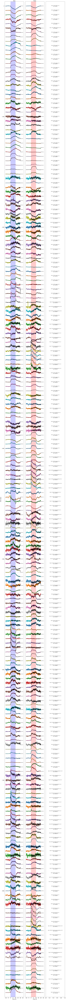

In [14]:
expt_ids_plot = range(len(df_param_lin))
nroi_plot = len(expt_ids_plot)
t = np.arange(NT)*DT - 10

fig, axs = plt.subplots(1, 3, figsize=(15, nroi_plot), sharey=True,  tight_layout=True)
for cexpt, expt_id in enumerate(expt_ids_plot):
    # true response
    ## sine response
    row_s = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'S')].iloc[0]
    rsp_s = np.array(row_s).flatten()[6:]
    
    roi = row_s['ROI']
    fly = row_s['FLY']
    line = row_s['LINE']
    
    axs[0].axhline(-4*cexpt, lw=1, ls='--', c='gray')
    axs[0].plot(T, rsp_s - 4*cexpt, lw=3)
    
    ## pulse response
    row_p = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'P')].iloc[0]
    rsp_p = np.array(row_p).flatten()[6:]
    
    axs[1].axhline(-4*cexpt, lw=1, ls='--', c='gray')
    axs[1].plot(T, rsp_p - 4*cexpt, lw=3)
    
    axs[2].text(0.5, -4*cexpt, f'Expt: {expt_id}, ROI: {roi}, Fly: {fly}\nLine: {line}', ha='center', va='center')
    
    # prediction
    ## sine response
    row_s = df_pred_lin[(df_pred_lin['EXPT_ID'] == expt_id) & (df_pred_lin['STIM'] == 'S')].iloc[0]
    rsp_s = np.array(row_s).flatten()[6:]
    
    axs[0].plot(T, rsp_s - 4*cexpt, lw=2, c='k')
    
    ## pulse response
    row_p = df_pred_lin[(df_pred_lin['EXPT_ID'] == expt_id) & (df_pred_lin['STIM'] == 'P')].iloc[0]
    rsp_p = np.array(row_p).flatten()[6:]
    
    axs[1].plot(T, rsp_p - 4*cexpt, lw=2, c='k')
    
axs[0].set_ylabel('ROI index')

for ax, c, stim in zip(axs[:2], ['b', 'r'], ['Sine', 'Pulse']):
    ax.axvspan(T[IT_STIM[0]], T[IT_STIM[1]], color=c, alpha=.2)
    ax.set_title(stim)
    ax.set_ylim(-4*nroi_plot, 4)
    ax.set_xlabel('Time (s)')
    
set_font_size(axs, 16)

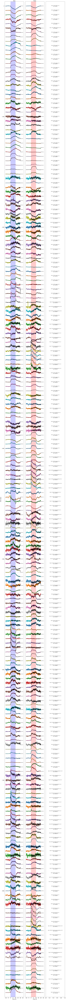

In [11]:
nroi_plot = 224
t = np.arange(NT)*DT - 10

fig, axs = plt.subplots(1, 3, figsize=(15, nroi_plot), sharey=True,  tight_layout=True)
for cexpt, expt_id in enumerate(expt_ids[:nroi_plot]):
    # true response
    ## sine response
    row_s = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'S')].iloc[0]
    rsp_s = np.array(row_s).flatten()[6:]
    
    roi = row_s['ROI']
    fly = row_s['FLY']
    line = row_s['LINE']
    
    axs[0].axhline(-4*cexpt, lw=1, ls='--', c='gray')
    axs[0].plot(T, rsp_s - 4*cexpt, lw=3)
    
    ## pulse response
    row_p = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'P')].iloc[0]
    rsp_p = np.array(row_p).flatten()[6:]
    
    axs[1].axhline(-4*cexpt, lw=1, ls='--', c='gray')
    axs[1].plot(T, rsp_p - 4*cexpt, lw=3)
    
    axs[2].text(0.5, -4*cexpt, f'Expt: {expt_id}, ROI: {roi}, Fly: {fly}\nLine: {line}', ha='center', va='center')
    
    # prediction
    ## sine response
    row_s = df_pred_lin[(df_pred_lin['EXPT_ID'] == expt_id) & (df_pred_lin['STIM'] == 'S')].iloc[0]
    rsp_s = np.array(row_s).flatten()[6:]
    
    axs[0].plot(T, rsp_s - 4*cexpt, lw=2, c='k')
    
    ## pulse response
    row_p = df_pred_lin[(df_pred_lin['EXPT_ID'] == expt_id) & (df_pred_lin['STIM'] == 'P')].iloc[0]
    rsp_p = np.array(row_p).flatten()[6:]
    
    axs[1].plot(T, rsp_p - 4*cexpt, lw=2, c='k')
    
    
axs[0].set_ylabel('ROI index')

for ax, c, stim in zip(axs[:2], ['b', 'r'], ['Sine', 'Pulse']):
    ax.axvspan(T[IT_STIM[0]], T[IT_STIM[1]], color=c, alpha=.2)
    ax.set_title(stim)
    ax.set_ylim(-4*nroi_plot, 4)
    ax.set_xlabel('Time (s)')
    
set_font_size(axs, 16)

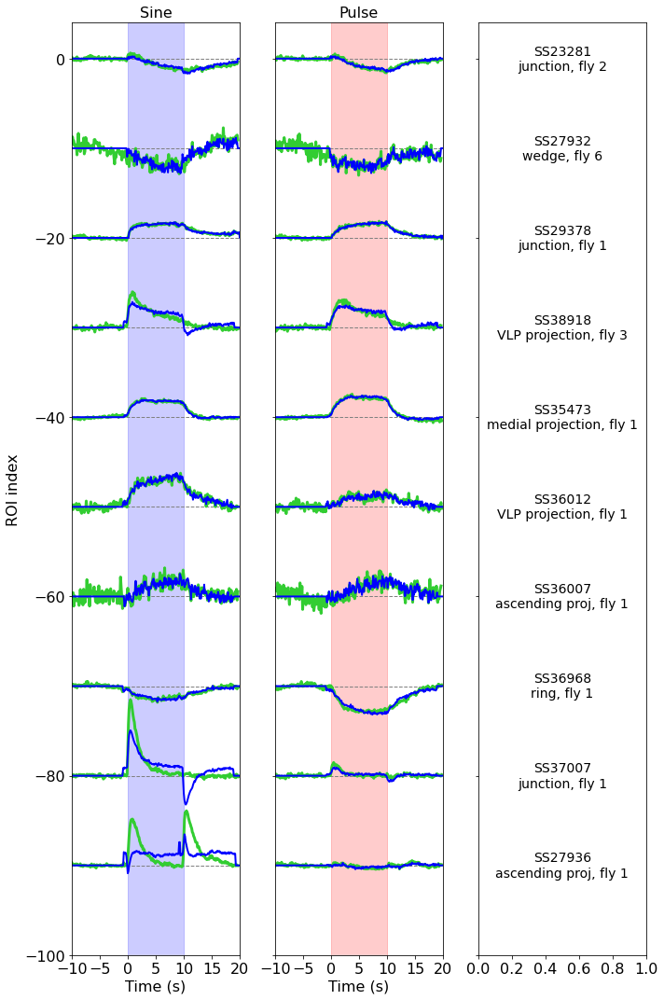

In [12]:
expt_ids_plot = [28, 46, 93, 148, 102, 126, 124, 132, 141, 66]
t = np.arange(NT)*DT - 10

fig, axs = plt.subplots(1, 3, figsize=(10, 1.5*len(expt_ids_plot)), sharey=True,  tight_layout=True)
for cexpt, expt_id in enumerate(expt_ids_plot):
    # true response
    ## sine response
    row_s = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'S')].iloc[0]
    rsp_s = np.array(row_s).flatten()[6:]
    
    axs[0].axhline(-10*cexpt, lw=1, ls='--', c='gray')
    axs[0].plot(T, rsp_s - 10*cexpt, lw=3, c='limegreen')
    
    roi = row_s['ROI']
    fly = row_s['FLY']
    line = row_s['LINE']
    
    ## pulse response
    row_p = df[(df['EXPT_ID'] == expt_id) & (df['STIM'] == 'P')].iloc[0]
    rsp_p = np.array(row_p).flatten()[6:]
    
    axs[1].axhline(-10*cexpt, lw=1, ls='--', c='gray')
    axs[1].plot(T, rsp_p - 10*cexpt, lw=3, c='limegreen')
    
#     axs[2].text(0.5, -10*cexpt, f'Line: {line}\n{roi}, fly {fly+1}\n(Response {expt_id})', ha='center', va='center', fontsize=14)
    axs[2].text(0.5, -10*cexpt, f'{line}\n{roi}, fly {fly+1}', ha='center', va='center', fontsize=14)
    
    # prediction
    ## sine response
    row_s = df_pred_lin[(df_pred_lin['EXPT_ID'] == expt_id) & (df_pred_lin['STIM'] == 'S')].iloc[0]
    rsp_s = np.array(row_s).flatten()[6:]
    
    axs[0].plot(T, rsp_s - 10*cexpt, lw=2, c='b')
    
    ## pulse response
    row_p = df_pred_lin[(df_pred_lin['EXPT_ID'] == expt_id) & (df_pred_lin['STIM'] == 'P')].iloc[0]
    rsp_p = np.array(row_p).flatten()[6:]
    
    axs[1].plot(T, rsp_p - 10*cexpt, lw=2, c='b')
    
    
axs[0].set_ylabel('ROI index')

for ax, c, stim in zip(axs[:2], ['b', 'r'], ['Sine', 'Pulse']):
    ax.axvspan(T[IT_STIM[0]], T[IT_STIM[1]], color=c, alpha=.2)
    ax.set_title(stim)
    ax.set_xlim(-10, 20)
    ax.set_ylim(-10*len(expt_ids_plot), 4)
    ax.set_xlabel('Time (s)')
    
set_font_size(axs, 16)